# Setting up a 3D Bayesian optimization problem with gaussian process regression

Jackson S. Bentley, Sumner B. Harris
09/01/25

In [ ]:
# Step 1: Clean uninstall of conflicting packages
!pip uninstall -y jax jaxlib ml-dtypes gpax

# Step 2: Install compatible versions
!pip install jax==0.6.2 jaxlib==0.6.2 ml_dtypes==0.5.1

# Step 3: Install gpax version that supports jax>=0.6.2
!pip install gpax==0.1.9

# Step 4: Force CPU use and test
import jax
import gpax

jax.config.update("jax_platform_name", "cpu")  # CPU only
gpax.utils.enable_x64()

print("✅ GPAX is ready with JAX version:", jax.__version__)


Found existing installation: jax 0.5.3
Uninstalling jax-0.5.3:
  Successfully uninstalled jax-0.5.3
Found existing installation: jaxlib 0.5.3
Uninstalling jaxlib-0.5.3:
  Successfully uninstalled jaxlib-0.5.3
Found existing installation: ml_dtypes 0.5.3
Uninstalling ml_dtypes-0.5.3:
  Successfully uninstalled ml_dtypes-0.5.3
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 31.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 29.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.0/78.0 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 374.1/374.1 kB 14.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 466.3/466.3 kB 33.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 60.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.7/79.7 MB 9.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17

/usr/local/lib/python3.12/dist-packages/jaxlib/plugin_support.py:71: RuntimeWarning: JAX plugin jax_cuda12_plugin version 0.5.3 is installed, but it is not compatible with the installed jaxlib version 0.8.0, so it will not be used.
  warnings.warn(


✅ GPAX is ready with JAX version: 0.8.0


In [ ]:
# Define a degree symbol for later plotting
deg_sgn = '\N{DEGREE SIGN}'


# Define some functions for basic utilities

I define some normalization functions and a function to package up data to save/load and plot results.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rcParams, font_manager
import urllib.request

# === Font Setup ===
font_url = "https://github.com/google/fonts/raw/main/ofl/carlito/Carlito-Regular.ttf"
font_path = "/usr/share/fonts/truetype/Carlito-Regular.ttf"
urllib.request.urlretrieve(font_url, font_path)
font_manager.fontManager.addfont(font_path)

# List all fonts Matplotlib can see
for f in font_manager.findSystemFonts(fontpaths=None, fontext='ttf'):
    if "Carlito" in f:
        print(f)
    if "Carlito" not in f:
        print('not there')

# Set global font to Carlito
plt.rcParams['font.family'] = 'Carlito'
plt.rcParams['mathtext.fontset'] = 'custom'  # ensures math uses the same font family
plt.rcParams['mathtext.rm'] = 'Carlito'
plt.rcParams['mathtext.it'] = 'Carlito:italic'
plt.rcParams['mathtext.bf'] = 'Carlito:bold'

# === Coefficients ===
alpha = 6.0606*2
beta = 0.0876
gamma = 4.3879
delta = 0.0338

# === Normalization Helpers ===
def normalize(data, min_val, max_val):
    return (data - min_val) / (max_val - min_val)

def inverse_normalize(norm_data, min_val, max_val):
    return norm_data * (max_val - min_val) + min_val

# === Save/Load ===
def save_data(
    file_name,
    X_train, y_train,
    X_test,
    x1, x2, x3,
    y_pred, y_sampled,
    acq, next_point,
    running_best,
    iteration
):
    np.savez(
        file_name,
        X_train=X_train,
        y_train=y_train,
        X_test=X_test,
        x1=x1,
        x2=x2,
        x3=x3,
        y_pred=y_pred,
        y_sampled=y_sampled,
        acq=acq,
        next_point=next_point,
        running_best=running_best,
        iteration=iteration
    )

def load_data(file_name):
    ds = np.load(file_name, allow_pickle=True)
    return (
        ds['X_train'],
        ds['y_train'],
        ds['X_test'],
        ds['x1'],
        ds['x2'],
        ds['x3'],
        ds['y_pred'],
        ds['y_sampled'],
        ds['acq'],
        ds['next_point'],
        ds['running_best'],
        ds['iteration']
    )

# === Data update helper ===
def update_datapoints(X_new, y_new, X_train, y_train):
    """
    X_new: (N_samples, N_dims) normalized
    y_new: (N_samples,)
    """
    import jax.numpy as jnp
    X_train = jnp.append(X_train, X_new, axis=0)
    y_train = jnp.append(y_train, y_new, axis=0)
    return X_train, y_train

# === Main plotting function with selector ===
def plot_3d_projections(
    field_flat,      # 1D array of length nP * nT * nF
    P_array,         # 1D array of length nP (physical values)
    T_array,         # 1D array of length nT (physical values)
    F_array,         # 1D array of length nF (physical values)
    title: str,
    X_train: np.ndarray = None,  # shape (n_samples,3) in normalized space
    y_train: np.ndarray = None,  # shape (n_samples,)
    deg_sgn: str = '°',
    vmin=None,
    vmax=None,
    point_selector: np.ndarray = None,
    highlight_point=None
):
    """
    Plot 3 projections (P vs T, P vs F, T vs F) of a 3D field,
    and scatter the measured X_train points colored by y_train.
    You can pass `point_selector` as a list of indices or a boolean mask
    to choose which points to plot.
    """
    # Convert to numpy
    field = np.asarray(field_flat)
    nP, nT, nF = len(P_array), len(T_array), len(F_array)
    if field.size != nP * nT * nF:
        raise ValueError(f"field length {field.size} != {nP}*{nT}*{nF}")

    # Reshape into 3D
    field3d = field.reshape(nP, nT, nF)

    # Compute 2D projections
    proj_PT = field3d.mean(axis=2)  # shape (nP, nT)
    proj_PF = field3d.mean(axis=1)  # shape (nP, nF)
    proj_TF = field3d.mean(axis=0)  # shape (nT, nF)

    # Set up subplots
    fig, axs = plt.subplots(1, 3, figsize=(18, 6), dpi=250, constrained_layout=True)
    for ax in axs:
        ax.tick_params(axis='both', labelsize=12)

    font_title = 22
    font_label = 18
    font_tick = 14

    # === Heatmaps ===
    im0 = axs[0].pcolormesh(P_array, T_array, proj_PT.T, shading='auto', cmap='nipy_spectral', vmin=vmin, vmax=vmax)
    axs[0].set_xlabel('log$_{10}$ O$_2$ Partial Pressure (log$_{10}$ Torr)', fontsize=font_label)
    axs[0].set_ylabel(f'Deposition Temperature ({deg_sgn}C)', fontsize=font_label)
    axs[0].set_title(f'{title} → T vs P', fontsize=font_title)
    fig.colorbar(im0, ax=axs[0], orientation='vertical')

    im1 = axs[1].pcolormesh(P_array, F_array, proj_PF.T, shading='auto', cmap='nipy_spectral', vmin=vmin, vmax=vmax)
    axs[1].set_xlabel('log$_{10}$ O$_2$ Partial Pressure (log$_{10}$ Torr)', fontsize=font_label)
    axs[1].set_ylabel('Fluence (J/cm$^2$)', fontsize=font_label)
    axs[1].set_title(f'{title} → F vs P', fontsize=font_title)
    fig.colorbar(im1, ax=axs[1], orientation='vertical')

    im2 = axs[2].pcolormesh(T_array, F_array, proj_TF.T, shading='auto', cmap='nipy_spectral', vmin=vmin, vmax=vmax)
    axs[2].set_xlabel(f'Deposition Temperature ({deg_sgn}C)', fontsize=font_label)
    axs[2].set_ylabel('Fluence (J/cm$^2$)', fontsize=font_label)
    axs[2].set_title(f'{title} → F vs T', fontsize=font_title)
    fig.colorbar(im2, ax=axs[2], orientation='vertical')

    # === Scatter points ===
    if X_train is not None and y_train is not None:
        # Apply selector if given
        if point_selector is not None:
            if point_selector.dtype == bool:  # boolean mask
                X_plot = X_train[point_selector]
                y_plot = y_train[point_selector]
            else:  # indices
                X_plot = X_train[np.array(point_selector)]
                y_plot = y_train[np.array(point_selector)]
        else:
            X_plot = X_train
            y_plot = y_train

        # Denormalize train points (define your min/max globally before calling)
        P_train = inverse_normalize(X_plot[:, 0], pressure_min, pressure_max)
        T_train = inverse_normalize(X_plot[:, 1], T_min, T_max)
        F_train = inverse_normalize(X_plot[:, 2], fluence_min, fluence_max)
        y_vals = y_plot.flatten()

        scatter_kwargs = dict(c=y_vals, cmap='Reds', edgecolor='k', s=400, alpha=1)

        sc0 = axs[0].scatter(P_train, T_train, **scatter_kwargs, vmin=0.3, vmax=3.1)
        sc1 = axs[1].scatter(P_train, F_train, **scatter_kwargs, vmin=0.3, vmax=3.1)
        sc2 = axs[2].scatter(T_train, F_train, **scatter_kwargs, vmin=0.3, vmax=3.1)

        from mpl_toolkits.axes_grid1.inset_locator import inset_axes
        cbar_ax = inset_axes(
            axs[2],
            width="60%",
            height="5%",
            loc='upper left',
            bbox_to_anchor=(0.55, 0.3, 1, 1),
            bbox_transform=axs[2].transAxes,
            borderpad=0,
        )

        cbar = fig.colorbar(sc0, cax=cbar_ax, orientation='horizontal')
        cbar.set_label('Sample\nScores', fontsize=font_label)
        cbar.ax.tick_params(labelsize=font_tick)

    # === Highlight the max acquisition point ===
    if highlight_point is not None:
        # highlight_point is normalized (like X_next from run_BO_step)
        P_high = inverse_normalize(highlight_point[0], pressure_min, pressure_max)
        T_high = inverse_normalize(highlight_point[1], T_min, T_max)
        F_high = inverse_normalize(highlight_point[2], fluence_min, fluence_max)

        # Draw a big red “X” at that location on each subplot
        axs[0].scatter(P_high, T_high, marker='x', c='red', s=250, linewidths=7, label='Max Acquisition')
        axs[1].scatter(P_high, F_high, marker='x', c='red', s=250, linewidths=7)
        axs[2].scatter(T_high, F_high, marker='x', c='red', s=250, linewidths=7)

    # === Title ===
    fig.suptitle(
        f"{title}: Min-Max Scaling\n"
        r"$y_{\mathrm{train}} = \alpha \cdot |c - 3.945| + \beta \cdot R_{RMS} + \gamma \cdot FWHM + \delta \cdot LaVO_{4}$" + "\n" +
        f"[α = {alpha}, β = {beta}, γ = {gamma}, δ = {delta}]",
        fontsize=16,
        fontweight='bold',
        y=1.17
    )
    plt.show()


not there
not there
not there
not there
not there
not there
not there
not there
not there
not there
/usr/share/fonts/truetype/Carlito-Regular.ttf
not there
not there
not there
not there
not there
not there
not there


# Set up the grid size

In [ ]:
import numpy as np

# --- Pressure (same as before) ---
start, stop = 3e-8, 3e-4
num_points_per_decade = 10
total_decades = int(np.log10(stop / start))
total_points = total_decades * num_points_per_decade + 1

# log-space array (in decades) then take log to work in log-pressure
Pressure = np.log10(np.geomspace(start, stop, num=total_points))
pressure_min, pressure_max = Pressure.min(), Pressure.max()

# --- Temperature (same as before) ---
T_min, T_max, T_stepsize = 500, 835, 20
Temperature = np.arange(T_min, T_max, T_stepsize, dtype=np.float32)

# --- Fluence  ---
fluence_min, fluence_max, fluence_stepsize = 0.8, 2.2, 0.1
Fluence = np.arange(fluence_min, fluence_max, fluence_stepsize, dtype=np.float32)

# --- Make normalized grids ---
P_norm = normalize(Pressure, pressure_min, pressure_max)
T_norm = normalize(Temperature, T_min, T_max)
F_norm = normalize(Fluence, fluence_min, fluence_max)

# 3D meshgrid
Pg, Tg, Fg = np.meshgrid(P_norm, T_norm, F_norm, indexing='ij')

# flatten each and stack into N×3 array
P_flat = Pg.reshape(-1, 1)
T_flat = Tg.reshape(-1, 1)
F_flat = Fg.reshape(-1, 1)

points_3d = np.hstack((P_flat, T_flat, F_flat))

print('3D parameter space has size:', points_3d.shape)
print('Pressure points:', Pressure.shape)
print('Temperature points:', Temperature.shape)
print('Fluence points:', Fluence.shape)
print('Back-transformed Pressure:', 10**(Pressure))


3D parameter space has size: (9758, 3)
Pressure points: (41,)
Temperature points: (17,)
Fluence points: (14,)
Back-transformed Pressure: [3.00000000e-08 3.77677624e-08 4.75467958e-08 5.98578694e-08
 7.53565929e-08 9.48683298e-08 1.19432151e-07 1.50356170e-07
 1.89287203e-07 2.38298470e-07 3.00000000e-07 3.77677624e-07
 4.75467958e-07 5.98578694e-07 7.53565929e-07 9.48683298e-07
 1.19432151e-06 1.50356170e-06 1.89287203e-06 2.38298470e-06
 3.00000000e-06 3.77677624e-06 4.75467958e-06 5.98578694e-06
 7.53565929e-06 9.48683298e-06 1.19432151e-05 1.50356170e-05
 1.89287203e-05 2.38298470e-05 3.00000000e-05 3.77677624e-05
 4.75467958e-05 5.98578694e-05 7.53565929e-05 9.48683298e-05
 1.19432151e-04 1.50356170e-04 1.89287203e-04 2.38298470e-04
 3.00000000e-04]


# Initialize the noise and kernel lengthscale prior distributions and visualize

In [ ]:
import numpyro
from numpyro import distributions
from jax import random

# Define custom priors
lengthscale_prior_dist = distributions.LogNormal(-0.0, 1.0)
noise_prior_dist = distributions.HalfNormal(0.5)

rng_key = random.PRNGKey(0)
noise_dist = numpyro.sample("k_length", noise_prior_dist,rng_key=rng_key, sample_shape=(1,10000))
length_dist = numpyro.sample("k_length", lengthscale_prior_dist,rng_key=rng_key, sample_shape=(1,10000))

# Set up code for each GP step
Here, we use variational inference GP with a Matern kernel.

Currently, we're using the expected improvement acquisition function.

In [ ]:
import jax.numpy as jnp
import jax
import gpax

# enable 64-bit precision
gpax.utils.enable_x64()

def step_GP(X_measured, y_measured, X_unmeasured,
            noise_prior_dist=None,
            lengthscale_prior_dist=None):
    """Single GP step in 3D (T, P, Fluence)."""
    # 1) RNG keys
    rng_key1, rng_key2 = gpax.utils.get_keys()

    # 2) Initialize a 3-dimensional GP
    gp_model = gpax.viGP(
        input_dim=3,
        kernel='Matern',
        noise_prior_dist=noise_prior_dist,
        lengthscale_prior_dist=lengthscale_prior_dist
    )

    # 3) Fit via HMC
    print('Training Model.')
    gp_model.fit(rng_key1, X_measured, y_measured, jitter=1e-2)

    # 4) Predict at all unmeasured points
    print('Getting Model Predictions.')
    y_pred, y_sampled = gp_model.predict_in_batches(
        rng_key2,
        X_unmeasured,
        noiseless=False,
        jitter=1e-2
    )

    # 5) Compute Expected Improvement
    print('Calculating acquisition.')
    acquisition = gpax.acquisition.EI(
        rng_key2,
        gp_model,
        X_unmeasured,
        maximize=False,
        recent_points=X_measured,
        noiseless=False,
        jitter=1e-2,
        penalty='delta'
    )

    # 6) (Optional) get posterior samples of hyperparameters
    print('Getting parameter samples.')
    paras = gp_model.get_samples()

    return acquisition, y_pred, y_sampled, paras, gp_model


# Input initial seed points

Here, I input your initial data save them to the "BO_initial_data.npz" file

In [ ]:
### --- Import all data here --- ###
import numpy as np
from google.colab import files
#uploaded = files.upload()
import pandas as pd
import matplotlib.pyplot as plt
import os

# Load the Excel spreadsheet
file_path = '/content/LaVO3_PLD_Parameters_working_pressure_fixed_cleaned_up_no_10nm_no_LaVO4_to_B38.xlsx'  # Change this to your actual file path
#file_path = '/content/LaVO3_PLD_Parameters_cleaned_up_STO_no_10nm_SBH.xlsx'
sheet_name = 'Sheet1'         # Modify if your data is on a different sheet

# Read the Excel file into a DataFrame
df = pd.read_excel(file_path, sheet_name=sheet_name)

# Preview the data
#print("Preview of imported data:")
#print(df.head())

# Assume the unique sample identifiers are in a column called 'Sample ID' and so on

sample_ids = df['Sample ID']
dates = df['Date (YYMMDD)']
substrates = df['Substrate']
fluence = df['Fluence (J/cm2)']
spot_size = df['Spot Size (mmxmm)']
o2_flow = df['O2 Flow (sccm)']
o2_pressure = df['O2 Pressure (Torr)']
working_pressure = df['Working pressure (Torr)']
base_pressure = df['Base Pressure (Torr)']
target = df['Target (1")']
number_shots = df['Number Shots']
substrate_temp = df['Substrate Temp. (C) (based on average of temperature measured near substrate)']
rep_rate = df['Rep Rate (Hz)']
xrd = df['XRD']
xrr = df['XRR']
thickness_la_vo3 = df['Thickness (nm) (LaVO3 .cif, XRR)']
thickness_la_vo4 = df['Thickness (nm) (LaVO4, XRR)']
afm = df['AFM']
roughness = df['Roughness (nm) (standard deviation of height: 3x3 um, 2 Hz, 512 sam/l, B25 sub only = 0.147 )']
thickness_fringes = df['Thickness - fitting fringes (nm)']
c_lattice_parameter = df['C Lattice Parameter from Fringes (Å) (or 2Tw  peak position*)']
number_unit_cells = df['Number Unit Cells from Fringes']
thickness_per_shot = df['Thickness /shot from Fringes (nm/shot)']
rocking_curve = df['Rocking Curve']
fwhm_rocking_curve = df['FWHM (deg) (Gaussian fitting of rocking curve: B25: sub only, 1 twin=0.0050 )']
narrow_scan = df['Narrow Scan (43-51, 005, 2)']
integrated_intensity = df['Integrated LaVO4 Intensity: 48-51, normalized, x10^6 [B25 sub only= 4.7 (250520)]']
rsm = df['RSM']

seed_points_raw = np.column_stack((o2_pressure, substrate_temp, fluence))


### --- Set up Objective Function --- ###

lvo_c_lit = 3.945

lattice_parameter_mismatch = np.abs(c_lattice_parameter - lvo_c_lit)
y_1 = alpha * lattice_parameter_mismatch
y_2 = beta * (roughness)
y_3 = gamma * (fwhm_rocking_curve)
y_4 = delta * (integrated_intensity)
y_train = (y_1 + y_2 + y_3 + y_4)

# Normalize the seed points into [0,1] space
seed_points = np.zeros_like(seed_points_raw, dtype=np.float32)
# pressure: we normalize log-pressure
seed_points[:, 0] = normalize(np.log10(seed_points_raw[:, 0]), pressure_min, pressure_max)
# temperature:
seed_points[:, 1] = normalize(seed_points_raw[:, 1], T_min, T_max)
# fluence: normalize using your fluence bounds
seed_points[:, 2] = normalize(seed_points_raw[:, 2], fluence_min, fluence_max)

X_train = seed_points

# X_test should now be full 3D grid, e.g. `points_3d` from before
X_test = points_3d

# Save the initial data, including x3=Fluence
file_name = "BO_initial_data"
save_data(
    file_name,
    X_train, y_train,
    X_test,
    x1=Pressure,
    x2=Temperature,
    x3=Fluence,
    y_pred=None,
    y_sampled=None,
    acq=None,
    next_point=None,
    running_best=100,
    iteration=0
)

print('y_1, peak position:', y_1)
print('y_2, roughness:', y_2)
print('y_3, fwhm_rocking_curve:', y_3)
print('y_4, integrated_intensity:', y_4)
print('y_train:', y_train)
print()
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("Raw seed points:\n", seed_points_raw)
print("Any NaNs:", np.isnan(y_train).any())
print("Any infs:", np.isinf(y_train).any())
print("y_train range:", y_train.min(), "to", y_train.max())
nan_mask = np.isnan(y_train)

# Show indices of NaNs
nan_indices = np.where(nan_mask)[0]
print("Indices with NaN values in y_train:", nan_indices)


y_1, peak position: 0     0.799999
1     0.763636
2     0.515151
3     0.266666
4     0.012121
5     0.993938
6     0.375757
7     0.472727
8     1.539392
9     0.206060
10    0.290909
11    0.533333
12    1.363635
13    0.000000
14    0.060606
15    1.163635
16    0.218182
17    1.999998
18    0.569696
19    0.242424
20    0.121212
21    0.030303
22    0.424242
23    0.024242
24    0.254545
25    0.024242
26    0.139394
27    0.030303
28    0.024242
Name: C Lattice Parameter from Fringes (Å) (or 2Tw  peak position*), dtype: float64
y_2, roughness: 0     0.087162
1     0.039420
2     0.035478
3     0.024002
4     0.026981
5     0.036880
6     0.017082
7     0.017082
8     0.026718
9     0.015680
10    1.016160
11    0.028996
12    0.021637
13    0.034602
14    0.085235
15    0.026543
16    0.656124
17    0.028120
18    0.017257
19    0.016031
20    0.020761
21    0.019009
22    0.034777
23    0.015943
24    0.202356
25    0.419604
26    0.015505
27    0.020498
28    0.019710
Name: Roug

# GP-BO Loop with EI acquisition

In [ ]:
def run_BO_step(previous_checkpoint_filename, X_new_unnormalized=None, y_new=None):
    # 1) Load your 3D data at the current step
    X_train, y_train, X_test, x1, x2, x3, \
    y_pred, y_sampled, acq, next_point, \
    running_best, iter = load_data(previous_checkpoint_filename)

    # 2) (Optional) work in normalized y-space
    y_train_normalized = y_train

    ##########------Update dataset with new value----###########
    if (X_new_unnormalized is not None and y_new is not None):
        iter += 1
        print('Updating dataset.')
        # normalize the new data points in each of the 3 dims
        X_new = np.zeros_like(X_new_unnormalized, dtype=np.float32)
        X_new[:, 0] = normalize(np.log10(X_new_unnormalized[:, 0]), pressure_min, pressure_max)
        X_new[:, 1] = normalize(X_new_unnormalized[:, 1], T_min, T_max)
        X_new[:, 2] = normalize(X_new_unnormalized[:, 2], fluence_min, fluence_max)
        print(X_train.shape, y_train.shape)
        print(X_new.shape, y_new.shape)
        X_train, y_train = update_datapoints(X_new, y_new, X_train, y_train)

        # update running best if improved
        if y_new < running_best:
            print('Updating best data point.')
            running_best = y_new

    print(f"#######---Exploration step {iter}---#######")

    # --- NEW: choose indices to train GP on --- SELECTED INDICES!!!
    #selected_indices = np.array([0,1,2,3,4,5,6,7,8,9,10,11,12]) # 13 seed points
    #selected_indices = np.array([0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23])
    #selected_indices = np.array([0,1,2,3])
    #selected_indices = np.array([4,5,6,7,8])
    #selected_indices = np.array([9,10,11,12,13])
    #selected_indices = np.array([14,15,16,17,18])
    #selected_indices = np.array([19,20,21,22,23])
    selected_indices = np.array([24,25,26,27,28])


    # Train on all points up to the largest index:
    last_idx = selected_indices.max()
    train_idx = np.arange(last_idx + 1)  # include 0..last_idx

    # If you instead want only the selected ones (skipping in between):
    # train_idx = selected_indices

    X_train_for_GP = X_train[train_idx]
    y_train_for_GP = y_train[train_idx]

    # 3) Fit GP and compute acquisition on the full 3D grid
    acq, y_pred, y_sampled, _params, gp_model = step_GP(X_train_for_GP, y_train_for_GP, X_test)

    # 4) Select the next sampling point
    next_idx = acq.argmax()
    X_next = X_test[next_idx].reshape(1, -1)

    # 5) Current predicted best
    best_idx = y_pred.argmin()
    X_pred_best = X_test[best_idx].reshape(1, -1)

    # 6) Optional stopping criterion
    if acq.max() < 0.01:
        print('%%%%%%%%%%%%%%% SUGGESTED STOPPING POINT %%%%%%%%%%%%%%%')

    # 7) Save checkpoint (now including x3)
    result_file_path = f'BO_checkpoint_{iter}.npz'
    save_data(
        result_file_path,
        X_train, y_train, X_test,
        x1, x2, x3,
        y_pred, y_sampled, acq,
        next_point, running_best,
        iteration=iter
    )

    # 8) Denormalize next & best points
    next_P = inverse_normalize(X_next[0, 0], pressure_min, pressure_max)
    next_T = inverse_normalize(X_next[0, 1], T_min, T_max)
    next_F = inverse_normalize(X_next[0, 2], fluence_min, fluence_max)

    print(
        '%%%%%%%%% Next experiment %%%%%%%%%\n'
        f'Pressure = {10**(next_P):.2e}, '
        f'Temperature = {next_T:.0f}, '
        f'Fluence = {next_F:.2e}'
    )

    pred_best_P = inverse_normalize(X_pred_best[0, 0], pressure_min, pressure_max)
    pred_best_T = inverse_normalize(X_pred_best[0, 1], T_min, T_max)
    pred_best_F = inverse_normalize(X_pred_best[0, 2], fluence_min, fluence_max)

    print(
        '%%%%%%%%% Current Predicted Best %%%%%%%%%\n'
        f'Pressure = {10**(pred_best_P):.2e}, '
        f'Temperature = {pred_best_T:.0f}, '
        f'Fluence = {pred_best_F:.2e}'
    )

    # 9) Current best measured point
    best_meas_idx = np.argmin(y_train.flatten())
    meas_best_P = inverse_normalize(X_train[best_meas_idx, 0], pressure_min, pressure_max)
    meas_best_T = inverse_normalize(X_train[best_meas_idx, 1], T_min, T_max)
    meas_best_F = inverse_normalize(X_train[best_meas_idx, 2], fluence_min, fluence_max)
    meas_best_y = y_train.flatten()[best_meas_idx]

    print(
        '%%%%%%%%% Current Best Measured %%%%%%%%%\n'
        f'Pressure = {10**(meas_best_P):.2e}, '
        f'Temperature = {meas_best_T:.0f}, '
        f'Fluence = {meas_best_F:.2e}, '
        f'y = {meas_best_y:.4f}'
    )

    # 10) Plot the 3D results using the same selected points
    # include the selected index info in the title string
    idx_info = f" (Idx: {selected_indices.min()}–{selected_indices.max()})"

    # coordinates of the max acquisition point in normalized space:
    max_acq_point = X_next[0]  # shape (3,)

    plot_3d_projections(
        y_pred, x1, x2, x3,
        title='GP Mean' + idx_info,
        X_train=X_train,
        y_train=y_train,
        vmin=0.5,
        vmax=2.5,
        point_selector=selected_indices,
        highlight_point=max_acq_point
    )

    plot_3d_projections(
        y_sampled, x1, x2, x3,
        title='GP Variance' + idx_info,
        X_train=X_train,
        y_train=y_train,
        vmin=0.2,
        vmax=1.2,
        point_selector=selected_indices,
        highlight_point=max_acq_point
    )

    plot_3d_projections(
        acq, x1, x2, x3,
        title='Acquisition' + idx_info,
        X_train=X_train,
        y_train=y_train,
        vmin=0,
        vmax=0.4,
        point_selector=selected_indices,
        highlight_point=max_acq_point
    )
    return result_file_path


# Below is the optimization loop to run: only plotting selected sample growths from indices

#######---Exploration step 0---#######
Training Model.


100%|██████████| 1000/1000 [00:03<00:00, 303.75it/s, init loss: 40.1366, avg. loss [951-1000]: 33.6005]



Inferred GP parameters
k_length         [0.3244 0.8178 1.3042]
k_scale          1.2639
noise            0.1567
Getting Model Predictions.
Calculating acquisition.


Getting parameter samples.
%%%%%%%%% Next experiment %%%%%%%%%
Pressure = 1.50e-06, Temperature = 820, Fluence = 8.00e-01
%%%%%%%%% Current Predicted Best %%%%%%%%%
Pressure = 1.19e-06, Temperature = 820, Fluence = 8.00e-01
%%%%%%%%% Current Best Measured %%%%%%%%%
Pressure = 2.20e-05, Temperature = 700, Fluence = 1.00e+00, y = 0.3678


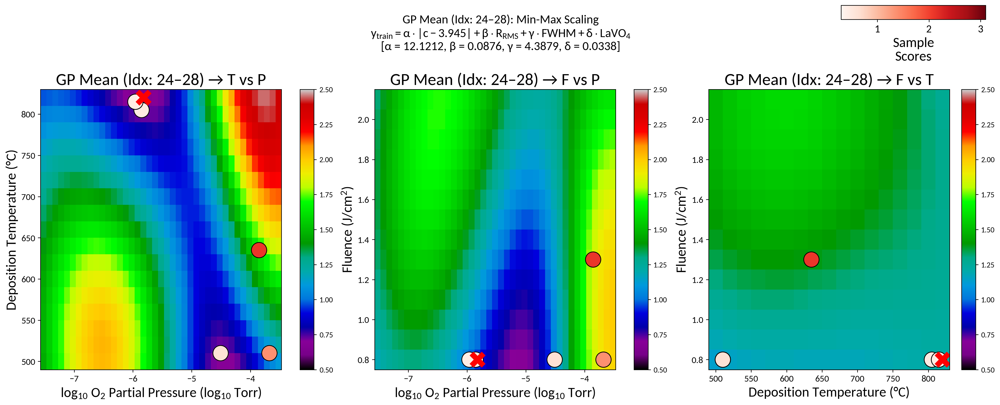

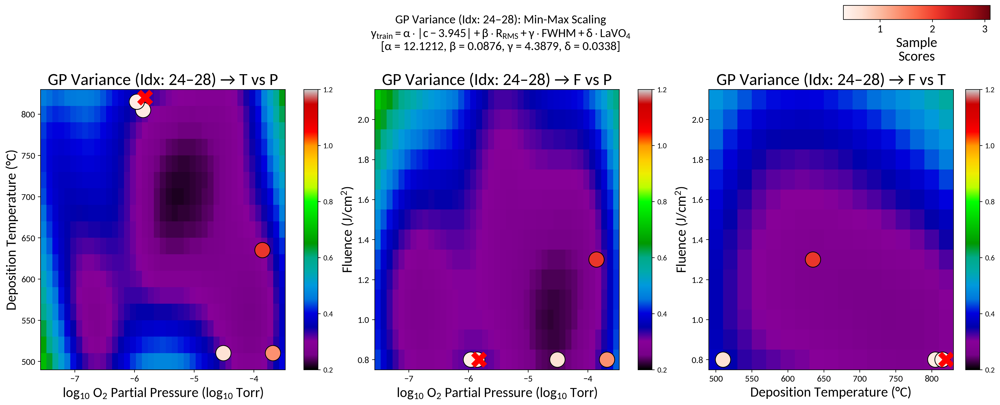

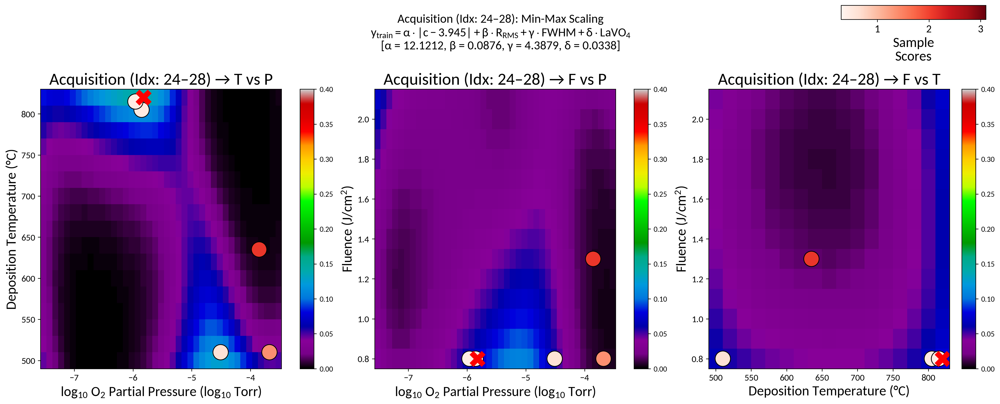

The results of this step are saved to a file named: BO_checkpoint_0.npz


In [ ]:
# Load your data at the current step
# for the very first training, you need to load your initial data (seed points)

previous_checkpoint_filename = '/content/BO_initial_data.npz'

results_file = run_BO_step(previous_checkpoint_filename) # give the GP the previous data
print('The results of this step are saved to a file named:', results_file)


# Find the Jacobian of the GP Surrogate Model

Training Model.


100%|██████████| 1000/1000 [00:03<00:00, 268.25it/s, init loss: 40.1366, avg. loss [951-1000]: 33.6005]



Inferred GP parameters
k_length         [0.3244 0.8178 1.3042]
k_scale          1.2639
noise            0.1567
Getting Model Predictions.
Calculating acquisition.
Getting parameter samples.
Jacobian shape: (9758, 3)
Mean predictions shape: (9758,)


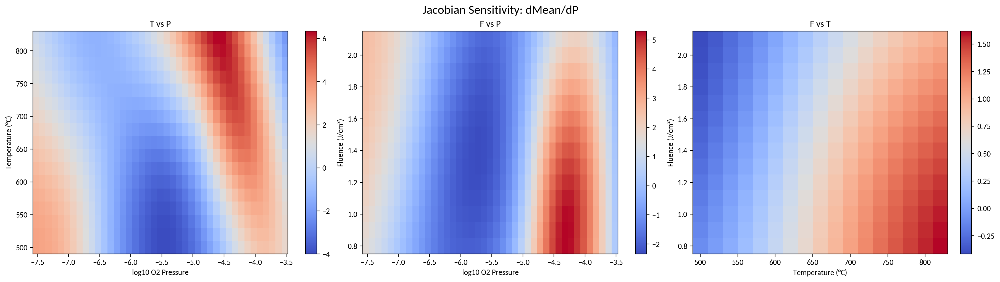

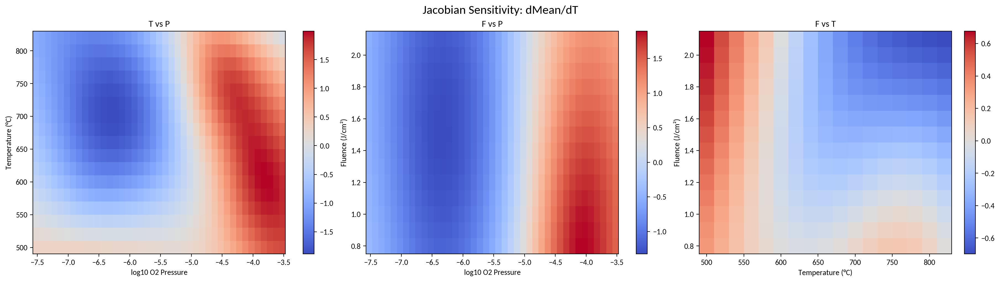

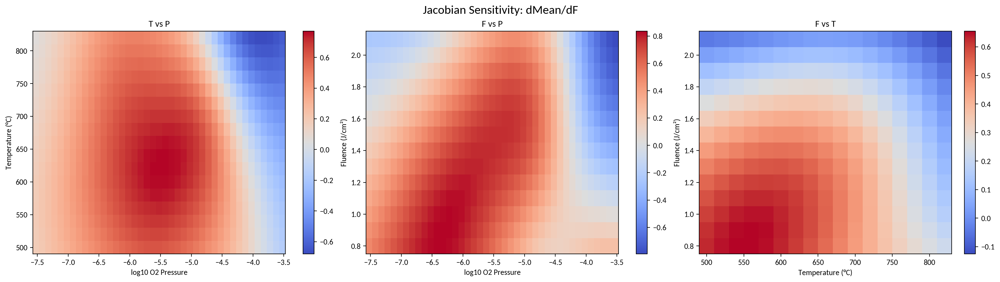

In [ ]:
import jax.numpy as jnp
from jax import jacfwd

# Load previous checkpoint
checkpoint_file = 'BO_initial_data.npz'  # or your last saved BO_checkpoint
X_train, y_train, X_test, x1, x2, x3, \
y_pred, y_sampled, acq, next_point, \
running_best, iteration = load_data(checkpoint_file)

# Choose which points to train GP on
selected_indices = np.arange(X_train.shape[0])  # train on all available points
X_train_for_GP = X_train[selected_indices]
y_train_for_GP = y_train[selected_indices]

# Run GP
acq, y_pred, y_sampled, _params, gp_model = step_GP(X_train_for_GP, y_train_for_GP, X_test)


# -------------------------------
# rng_key for GP predictions
# -------------------------------
rng_key_jac = jax.random.PRNGKey(123)

# -------------------------------
# Define mean function for the GP
# -------------------------------
def gp_mean_fn(x):
    """
    x: jnp array, shape (3,) for one point in normalized space
    returns: scalar GP mean prediction
    """
    y_pred, _ = gp_model.predict(rng_key_jac, x[None, :], noiseless=True, jitter=1e-2)
    return y_pred[0]

# -------------------------------
# Compute Jacobian for all test points
# -------------------------------
jacobian_list = []
mean_list = []

for x in X_test:
    x_jnp = jnp.array(x)
    J = jacfwd(gp_mean_fn)(x_jnp)  # d(GP mean)/d(inputs)
    jacobian_list.append(J)

    # Also store mean predictions
    mean_val, _ = gp_model.predict(rng_key_jac, x[None, :], noiseless=True, jitter=1e-2)
    mean_list.append(mean_val[0])

# Convert to numpy arrays
jacobian_array = jnp.stack(jacobian_list)  # shape: (n_points, 3)
mean_array = jnp.array(mean_list)          # shape: (n_points,)

print("Jacobian shape:", jacobian_array.shape)
print("Mean predictions shape:", mean_array.shape)

# -------------------------------
# Optional: reshape to grid shape
# -------------------------------
nP, nT, nF = len(Pressure), len(Temperature), len(Fluence)
jacobian_grid = jacobian_array.reshape(nP, nT, nF, 3)
mean_grid = mean_array.reshape(nP, nT, nF)


# -------------------------------
# Plotting Routine
# -------------------------------

# Choose which Jacobian component to plot: 0 = d/dP, 1 = d/dT, 2 = d/dF
jac_labels = ['dMean/dP', 'dMean/dT', 'dMean/dF']

for i in range(3):
    jac_component = jacobian_grid[..., i]  # shape (nP, nT, nF)

    # Compute 2D projections (same as your GP mean plotting)
    proj_PT = jac_component.mean(axis=2)  # average over F
    proj_PF = jac_component.mean(axis=1)  # average over T
    proj_TF = jac_component.mean(axis=0)  # average over P

    fig, axs = plt.subplots(1, 3, figsize=(18, 5), dpi=200, constrained_layout=True)
    fig.suptitle(f"Jacobian Sensitivity: {jac_labels[i]}", fontsize=16, fontweight='bold')

    im0 = axs[0].pcolormesh(x1, x2, proj_PT.T, shading='auto', cmap='coolwarm')
    axs[0].set_xlabel('log10 O2 Pressure')
    axs[0].set_ylabel('Temperature (°C)')
    axs[0].set_title('T vs P')
    fig.colorbar(im0, ax=axs[0])

    im1 = axs[1].pcolormesh(x1, x3, proj_PF.T, shading='auto', cmap='coolwarm')
    axs[1].set_xlabel('log10 O2 Pressure')
    axs[1].set_ylabel('Fluence (J/cm²)')
    axs[1].set_title('F vs P')
    fig.colorbar(im1, ax=axs[1])

    im2 = axs[2].pcolormesh(x2, x3, proj_TF.T, shading='auto', cmap='coolwarm')
    axs[2].set_xlabel('Temperature (°C)')
    axs[2].set_ylabel('Fluence (J/cm²)')
    axs[2].set_title('F vs T')
    fig.colorbar(im2, ax=axs[2])

    plt.show()


# Different visualization of the GP Surrogate Model: including mean values as colors of points & arrows, but only 2-D projections

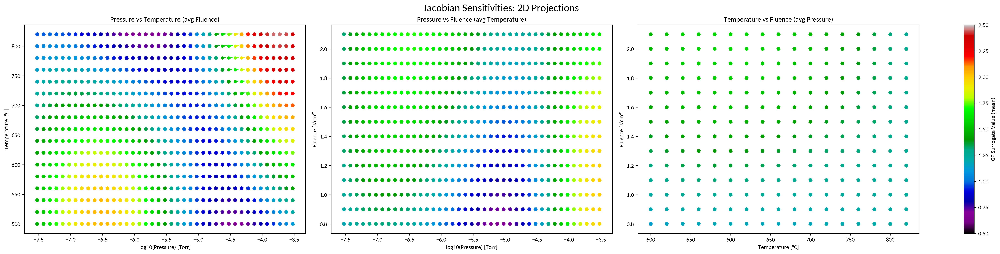

In [ ]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import jax.numpy as jnp

# Create full 3D grids for plotting
P, T, F = np.meshgrid(Pressure, Temperature, Fluence, indexing='ij')

# ------------------------------
# Denormalize gradient components to physical units
# ------------------------------
scale_factors = jnp.array([
    pressure_max - pressure_min,
    T_max - T_min,
    fluence_max - fluence_min
])
v_grid = np.array(jacobian_grid * scale_factors)  # shape: (nP, nT, nF, 3)
scores_grid = np.array(mean_grid)                 # GP mean values

# ------------------------------
# 3×2D projections plotting
# ------------------------------
fig, axes = plt.subplots(1, 3, figsize=(24, 6), dpi=300, constrained_layout=True)

norm = mpl.colors.Normalize(vmin=0.5, vmax=2.5)
cmap = plt.cm.nipy_spectral
arrow_lengths = 350
linewidth = 0.015

# --- 1) Pressure vs Temperature (average over Fluence) ---
score_mean = scores_grid.mean(axis=2)
v_mean = v_grid.mean(axis=2)
x2d = P[:, :, 0]
y2d = T[:, :, 0]
dx = v_mean[:, :, 0]
dy = v_mean[:, :, 1]

ax = axes[0]
ax.scatter(x2d.ravel(), y2d.ravel(), c=score_mean.ravel(), cmap=cmap, norm=norm, s=20)
ax.quiver(x2d, y2d, dx, dy, score_mean, angles='xy', scale_units='xy', scale=arrow_lengths,
          width=linewidth, cmap=cmap, norm=norm, alpha=0.9)
ax.set_xlabel('log10(Pressure) [Torr]')
ax.set_ylabel('Temperature [°C]')
ax.set_title('Pressure vs Temperature (avg Fluence)')

# --- 2) Pressure vs Fluence (average over Temperature) ---
score_mean = scores_grid.mean(axis=1)
v_mean = v_grid.mean(axis=1)
x2d = P[:, 0, :]
y2d = F[:, 0, :]
dx = v_mean[:, :, 0]
dy = v_mean[:, :, 2]

ax = axes[1]
ax.scatter(x2d.ravel(), y2d.ravel(), c=score_mean.ravel(), cmap=cmap, norm=norm, s=20)
ax.quiver(x2d, y2d, dx, dy, score_mean, angles='xy', scale_units='xy', scale=arrow_lengths,
          width=linewidth, cmap=cmap, norm=norm, alpha=0.9)
ax.set_xlabel('log10(Pressure) [Torr]')
ax.set_ylabel('Fluence [J/cm²]')
ax.set_title('Pressure vs Fluence (avg Temperature)')

# --- 3) Temperature vs Fluence (average over Pressure) ---
score_mean = scores_grid.mean(axis=0)
v_mean = v_grid.mean(axis=0)
x2d = T[0, :, :]
y2d = F[0, :, :]
dx = v_mean[:, :, 1]
dy = v_mean[:, :, 2]

ax = axes[2]
ax.scatter(x2d.ravel(), y2d.ravel(), c=score_mean.ravel(), cmap=cmap, norm=norm, s=20)
ax.quiver(x2d, y2d, dx, dy, score_mean, angles='xy', scale_units='xy', scale=arrow_lengths,
          width=linewidth, cmap=cmap, norm=norm, alpha=0.9)
ax.set_xlabel('Temperature [°C]')
ax.set_ylabel('Fluence [J/cm²]')
ax.set_title('Temperature vs Fluence (avg Pressure)')

# Colorbar
cbar = fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap),
                    ax=axes.ravel().tolist(), label='GP Surrogate Value (mean)')
plt.suptitle("Jacobian Sensitivities: 2D Projections", fontsize=18)
plt.show()


# Different visualization of the GP Surrogate Model: including mean values as colors of points & arrows, but including slices across surrogate model

In [ ]:
# ------------------------------
# Prepare grids for plotting
# ------------------------------
P, T, F = np.meshgrid(Pressure, Temperature, Fluence, indexing='ij')

# Denormalize Jacobian vectors to native units
scale_factors = np.array([
    Pressure.max() - Pressure.min(),
    Temperature.max() - Temperature.min(),
    Fluence.max() - Fluence.min()
])
v_grid = jacobian_grid * scale_factors  # shape: (nP, nT, nF, 3)
scores_grid = mean_grid                 # GP mean values

# ------------------------------
# Plotting helpers
# ------------------------------
def slice_indices(levels, low, high, include_high=False):
    if include_high:
        return np.where((levels >= low) & (levels <= high))[0]
    else:
        return np.where((levels >= low) & (levels <  high))[0]

# ------------------------------
# Visualization: 3×4 subplots
# ------------------------------
fig, axes = plt.subplots(3, 4, figsize=(24, 18), dpi=300, constrained_layout=True)

fluence_slices      = np.linspace(Fluence.min(), Fluence.max(), 5)
temperature_slices  = np.linspace(Temperature.min(), Temperature.max(), 5)
pressure_slices     = np.linspace(Pressure.min(), Pressure.max(), 5)

norm = mpl.colors.Normalize(vmin=0.5, vmax=2.5)
cmap = plt.cm.nipy_spectral
arrow_lengths = 150
linewidth = 0.02

# Row 0: Pressure vs Temperature, average across Fluence slice
for col in range(4):
    ax = axes[0, col]
    f_low, f_high = fluence_slices[col], fluence_slices[col+1]
    idxF = slice_indices(Fluence, f_low, f_high, include_high=(col == 3))
    if idxF.size == 0:
        ax.set_axis_off()
        continue

    score_mean = scores_grid[:, :, idxF].mean(axis=2)
    v_mean = v_grid[:, :, idxF, :].mean(axis=2)

    x2d = P[:, :, 0]
    y2d = T[:, :, 0]
    dx = v_mean[:, :, 0]
    dy = v_mean[:, :, 1]

    ax.scatter(x2d.ravel(), y2d.ravel(), c=score_mean.ravel(), cmap=cmap, norm=norm, s=20)
    ax.quiver(x2d, y2d, dx, dy, score_mean, angles='xy', scale_units='xy', scale=arrow_lengths,
              width=linewidth, cmap=cmap, norm=norm, alpha=0.9)
    ax.set_xlabel('log10(Pressure) [Torr]')
    ax.set_ylabel('Temperature [°C]')
    ax.set_title(f'Fluence slice: {f_low:.2f}–{f_high:.2f} J/cm²')

# Row 1: Fluence vs log10(Pressure), average across Temperature slice
for col in range(4):
    ax = axes[1, col]
    t_low, t_high = temperature_slices[col], temperature_slices[col+1]
    idxT = slice_indices(Temperature, t_low, t_high, include_high=(col == 3))
    if idxT.size == 0:
        ax.set_axis_off()
        continue

    score_mean = scores_grid[:, idxT, :].mean(axis=1)
    v_mean = v_grid[:, idxT, :, :].mean(axis=1)

    x2d = P[:, 0, :]
    y2d = F[:, 0, :]
    dx = v_mean[:, :, 0]
    dy = v_mean[:, :, 2]

    ax.scatter(x2d.ravel(), y2d.ravel(), c=score_mean.ravel(), cmap=cmap, norm=norm, s=20)
    ax.quiver(x2d, y2d, dx, dy, score_mean, angles='xy', scale_units='xy', scale=arrow_lengths,
              width=linewidth, cmap=cmap, norm=norm, alpha=0.9)
    ax.set_xlabel('log10(Pressure) [Torr]')
    ax.set_ylabel('Fluence [J/cm²]')
    ax.set_title(f'Temperature slice: {t_low:.0f}–{t_high:.0f} °C')

# Row 2: Fluence vs Temperature, average across Pressure slice
for col in range(4):
    ax = axes[2, col]
    p_low, p_high = pressure_slices[col], pressure_slices[col+1]
    idxP = slice_indices(Pressure, p_low, p_high, include_high=(col == 3))
    if idxP.size == 0:
        ax.set_axis_off()
        continue

    score_mean = scores_grid[idxP, :, :].mean(axis=0)
    v_mean = v_grid[idxP, :, :, :].mean(axis=0)

    x2d = T[0, :, :]
    y2d = F[0, :, :]
    dx = v_mean[:, :, 1]
    dy = v_mean[:, :, 2]

    ax.scatter(x2d.ravel(), y2d.ravel(), c=score_mean.ravel(), cmap=cmap, norm=norm, s=20)
    ax.quiver(x2d, y2d, dx, dy, score_mean, angles='xy', scale_units='xy', scale=arrow_lengths,
              width=linewidth, cmap=cmap, norm=norm, alpha=0.9)
    ax.set_xlabel('Temperature [°C]')
    ax.set_ylabel('Fluence [J/cm²]')
    ax.set_title(f'Pressure slice: {10**p_low:.2e}–{10**p_high:.2e} Torr')

# Colorbar
cbar = fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap),
                    ax=axes.ravel().tolist(), label='GP Surrogate Value (slice mean)')

plt.suptitle("Jacobian Sensitivities | 20×20 Grid per Panel", fontsize=18)
plt.show()


# Same code as previous cell, but change grid and arrow sizes

In [ ]:
# ------------------------------
# Generate 20×20×20 grid for plotting
# ------------------------------
n_grid = 14
P_plot = np.linspace(Pressure.min(), Pressure.max(), n_grid)
T_plot = np.linspace(Temperature.min(), Temperature.max(), n_grid)
F_plot = np.linspace(Fluence.min(), Fluence.max(), n_grid)
P_grid, T_grid, F_grid = np.meshgrid(P_plot, T_plot, F_plot, indexing='ij')

# Optional: interpolate scores and vectors onto the new grid
from scipy.interpolate import RegularGridInterpolator

# Flatten original grids
points_orig = (Pressure, Temperature, Fluence)

# Interpolators
score_interp = RegularGridInterpolator(points_orig, mean_grid)
v_interp = [RegularGridInterpolator(points_orig, jacobian_grid[..., i]) for i in range(3)]

# Interpolate onto 20×20×20 grid
scores_grid = score_interp(np.stack([P_grid.ravel(), T_grid.ravel(), F_grid.ravel()], axis=-1)).reshape(n_grid, n_grid, n_grid)
v_grid = np.stack([vi(np.stack([P_grid.ravel(), T_grid.ravel(), F_grid.ravel()], axis=-1)).reshape(n_grid, n_grid, n_grid) for vi in v_interp], axis=-1)

# ------------------------------
# Denormalize Jacobian vectors to native units
# ------------------------------
scale_factors = np.array([
    Pressure.max() - Pressure.min(),
    Temperature.max() - Temperature.min(),
    Fluence.max() - Fluence.min()
])
v_grid = v_grid * scale_factors  # shape: (20, 20, 20, 3)

# ------------------------------
# Plotting helpers
# ------------------------------
def slice_indices(levels, low, high, include_high=False):
    if include_high:
        return np.where((levels >= low) & (levels <= high))[0]
    else:
        return np.where((levels >= low) & (levels <  high))[0]

# ------------------------------
# Visualization: 3×4 subplots
# ------------------------------
fig, axes = plt.subplots(3, 4, figsize=(24, 18), dpi=350, constrained_layout=True)

fluence_slices      = np.linspace(Fluence.min(), Fluence.max(), 5)
temperature_slices  = np.linspace(Temperature.min(), Temperature.max(), 5)
pressure_slices     = np.linspace(Pressure.min(), Pressure.max(), 5)

norm = mpl.colors.Normalize(vmin=0.5, vmax=2.5)
cmap = plt.cm.nipy_spectral
arrow_lengths = 30
linewidth = 0.022
dot_size = 40

# Row 0: Pressure vs Temperature, average across Fluence slice
for col in range(4):
    ax = axes[0, col]
    f_low, f_high = fluence_slices[col], fluence_slices[col+1]
    #idxF = slice_indices(Fluence, f_low, f_high, include_high=(col == 3))
    idxF = slice_indices(F_plot, f_low, f_high, include_high=(col == 3))
    if idxF.size == 0:
        ax.set_axis_off()
        continue

    score_mean = scores_grid[:, :, idxF].mean(axis=2)
    v_mean = v_grid[:, :, idxF, :].mean(axis=2)

    x2d = P_grid[:, :, 0]
    y2d = T_grid[:, :, 0]
    dx = v_mean[:, :, 0]
    dy = v_mean[:, :, 1]

    ax.scatter(x2d.ravel(), y2d.ravel(), c=score_mean.ravel(), cmap=cmap, norm=norm, s=dot_size)
    ax.quiver(x2d, y2d, dx, dy, score_mean, angles='xy', scale_units='xy', scale=arrow_lengths,
              width=linewidth, cmap=cmap, norm=norm, alpha=0.9)
    ax.set_xlabel('log10(Pressure) [Torr]')
    ax.set_ylabel('Temperature [°C]')
    ax.set_title(f'Fluence slice: {f_low:.2f}–{f_high:.2f} J/cm²')

# Row 1: Fluence vs log10(Pressure), average across Temperature slice
for col in range(4):
    ax = axes[1, col]
    t_low, t_high = temperature_slices[col], temperature_slices[col+1]
    #idxT = slice_indices(Temperature, t_low, t_high, include_high=(col == 3))
    idxT = slice_indices(T_plot, t_low, t_high, include_high=(col == 3))
    if idxT.size == 0:
        ax.set_axis_off()
        continue

    score_mean = scores_grid[:, idxT, :].mean(axis=1)
    v_mean = v_grid[:, idxT, :, :].mean(axis=1)

    x2d = P_grid[:, 0, :]
    y2d = F_grid[:, 0, :]
    dx = v_mean[:, :, 0]
    dy = v_mean[:, :, 2]

    ax.scatter(x2d.ravel(), y2d.ravel(), c=score_mean.ravel(), cmap=cmap, norm=norm, s=dot_size)
    ax.quiver(x2d, y2d, dx, dy, score_mean, angles='xy', scale_units='xy', scale=arrow_lengths,
              width=linewidth, cmap=cmap, norm=norm, alpha=0.9)
    ax.set_xlabel('log10(Pressure) [Torr]')
    ax.set_ylabel('Fluence [J/cm²]')
    ax.set_title(f'Temperature slice: {t_low:.0f}–{t_high:.0f} °C')

# Row 2: Fluence vs Temperature, average across Pressure slice
for col in range(4):
    ax = axes[2, col]
    p_low, p_high = pressure_slices[col], pressure_slices[col+1]
    #idxP = slice_indices(Pressure, p_low, p_high, include_high=(col == 3))
    idxP = slice_indices(P_plot, p_low, p_high, include_high=(col == 3))
    if idxP.size == 0:
        ax.set_axis_off()
        continue

    score_mean = scores_grid[idxP, :, :].mean(axis=0)
    v_mean = v_grid[idxP, :, :, :].mean(axis=0)

    x2d = T_grid[0, :, :]
    y2d = F_grid[0, :, :]
    dx = v_mean[:, :, 1]
    dy = v_mean[:, :, 2]

    ax.scatter(x2d.ravel(), y2d.ravel(), c=score_mean.ravel(), cmap=cmap, norm=norm, s=dot_size)
    ax.quiver(x2d, y2d, dx, dy, score_mean, angles='xy', scale_units='xy', scale=arrow_lengths,
              width=linewidth, cmap=cmap, norm=norm, alpha=0.9)
    ax.set_xlabel('Temperature [°C]')
    ax.set_ylabel('Fluence [J/cm²]')
    ax.set_title(f'Pressure slice: {10**p_low:.2e}–{10**p_high:.2e} Torr')

# Colorbar
cbar = fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap),
                    ax=axes.ravel().tolist(), label='GP Surrogate Value (slice mean)')

plt.suptitle("Jacobian Sensitivities | 20×20 Grid per Panel", fontsize=18)
plt.show()


# Make a table for the average sensitivity magnitudes across slices of GP surrogate model mean

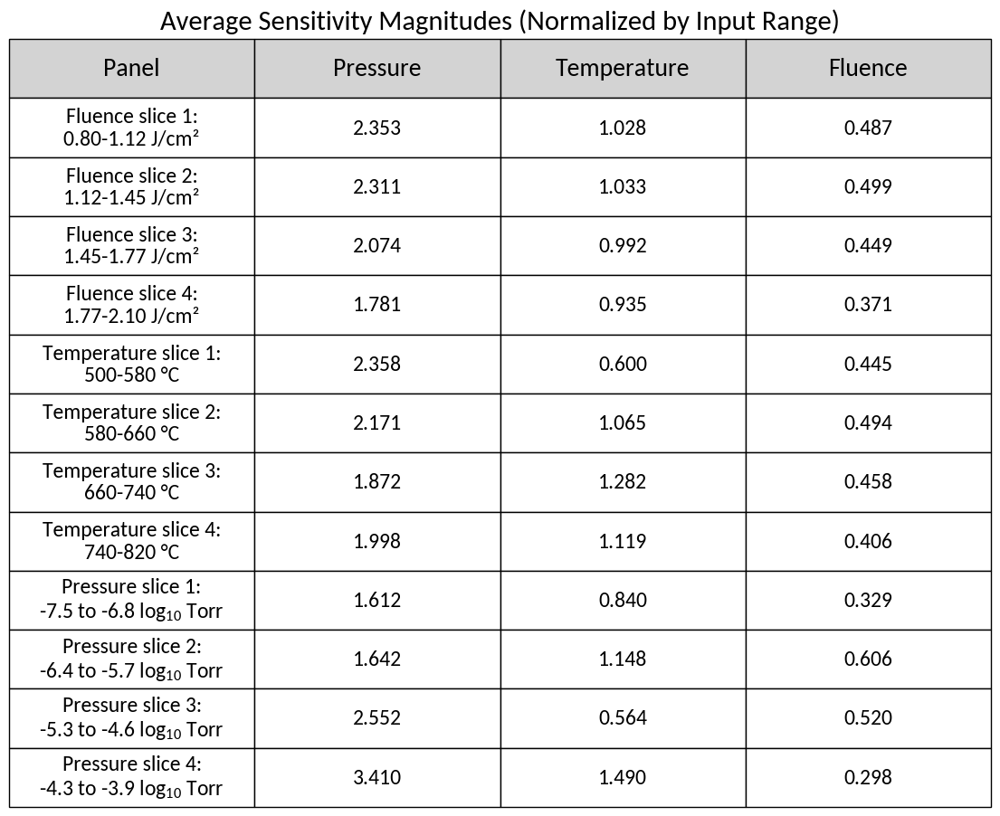

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# -------------------------------
# Input ranges for normalization
# -------------------------------
pressure_range = P_plot.max() - P_plot.min()
temperature_range = T_plot.max() - T_plot.min()
fluence_range = F_plot.max() - F_plot.min()
scale_factors = np.array([pressure_range, temperature_range, fluence_range])

# -------------------------------
# Define slices for table
# -------------------------------
n_slices = 4
fluence_slices      = np.linspace(F_plot.min(), F_plot.max(), n_slices + 1)
temperature_slices  = np.linspace(T_plot.min(), T_plot.max(), n_slices + 1)
pressure_slices     = np.linspace(P_plot.min(), P_plot.max(), n_slices + 1)

# -------------------------------
# Prepare table rows
# -------------------------------
table_rows = []

# Row 0: Pressure vs Temperature slices, avg over Fluence
for i in range(n_slices):
    idxF = np.where((F_plot >= fluence_slices[i]) & (F_plot < fluence_slices[i+1]))[0]
    if idxF.size == 0:
        continue
    v_slice = v_grid[:, :, idxF, :]
    sens_avg = np.abs(v_slice).mean(axis=(0,1,2)) / scale_factors  # normalize
    table_rows.append({
        'Panel': f'Fluence slice {i+1}: {fluence_slices[i]:.2f}-{fluence_slices[i+1]:.2f} J/cm²',
        'Pressure': sens_avg[0],
        'Temperature': sens_avg[1],
        'Fluence': sens_avg[2]
    })

# Row 1: Fluence vs Pressure slices, avg over Temperature
for i in range(n_slices):
    idxT = np.where((T_plot >= temperature_slices[i]) & (T_plot < temperature_slices[i+1]))[0]
    if idxT.size == 0:
        continue
    v_slice = v_grid[:, idxT, :, :]
    sens_avg = np.abs(v_slice).mean(axis=(0,1,2)) / scale_factors
    table_rows.append({
        'Panel': f'Temperature slice {i+1}: {temperature_slices[i]:.0f}-{temperature_slices[i+1]:.0f} °C',
        'Pressure': sens_avg[0],
        'Temperature': sens_avg[1],
        'Fluence': sens_avg[2]
    })

# Row 2: Fluence vs Temperature slices, avg over Pressure
for i in range(n_slices):
    idxP = np.where((P_plot >= pressure_slices[i]) & (P_plot < pressure_slices[i+1]))[0]
    if idxP.size == 0:
        continue
    v_slice = v_grid[idxP, :, :, :]
    sens_avg = np.abs(v_slice).mean(axis=(0,1,2)) / scale_factors
    table_rows.append({
        'Panel': f'Pressure slice {i+1}: {P_plot[idxP[0]]:.1f} to {P_plot[idxP[-1]]:.1f} log$_{{10}}$ Torr',
        'Pressure': sens_avg[0],
        'Temperature': sens_avg[1],
        'Fluence': sens_avg[2]
    })

# -------------------------------
# Create DataFrame
# -------------------------------
sens_table = pd.DataFrame(table_rows, columns=['Panel', 'Pressure', 'Temperature', 'Fluence'])

# -------------------------------
# Plot table
# -------------------------------
cell_text = []
for _, row in sens_table.iterrows():
    formatted_row = []
    for col in sens_table.columns:
        val = row[col]
        if col == 'Panel':
            text = str(val)
            if 'slice' in text:
                parts = text.split(':', 1)
                if len(parts) == 2:
                    text = parts[0] + ':\n' + parts[1].strip()
            formatted_row.append(text)
        elif isinstance(val, (float, np.floating)):
            formatted_row.append(f"{val:.3f}")
        else:
            formatted_row.append(str(val))
    cell_text.append(formatted_row)

n_rows = len(sens_table)
fig_height = n_rows * 0.8 + 1
fig, ax = plt.subplots(figsize=(14, fig_height))
ax.axis('off')

tbl = ax.table(
    cellText=cell_text,
    colLabels=sens_table.columns,
    cellLoc='center',
    loc='center'
)

tbl.auto_set_font_size(False)
tbl.set_fontsize(17)

for key, cell in tbl.get_celld().items():
    cell.set_height(0.08)
    if key[0] == 0:
        cell.set_fontsize(20)
        cell.set_facecolor('lightgrey')

plt.title('Average Sensitivity Magnitudes (Normalized by Input Range)', fontsize=22, pad=20)
plt.show()


# Visualize uncertainty of GP surrogate model with contour maps: RMS of uncertainty values for each slice at each point

In [ ]:
# -------------------------------
# GP mean (color) + RMS predictive std (contours)
# -------------------------------
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

# ========== CONFIG ==========
GRID_SIZE = 20
DPI = 350

SCATTER_SIZE = 100
MEAN_CMAP = plt.cm.nipy_spectral

UNC_CMAP = plt.cm.viridis
UNC_LINE_COLOR = None
UNC_LINEWIDTH = 7
UNC_LABEL_FONTSIZE = 25
UNC_LABEL_BOLD = True
UNC_LEVELS_COUNT = 15

AX_LABEL_FONTSIZE = 14
TITLE_FONTSIZE   = 13
TICK_FONTSIZE    = 11
SUPTITLE_FONTSIZE = 18

# ========== Helper functions ==========
def slice_indices(levels, low, high, include_high=False):
    """Return indices of 'levels' within [low, high) or [low, high] if include_high."""
    if include_high:
        return np.where((levels >= low) & (levels <= high))[0]
    else:
        return np.where((levels >= low) & (levels <  high))[0]

def label_uncertainty_contours(ax, cs):
    labels = ax.clabel(cs, fmt='%.2g', fontsize=UNC_LABEL_FONTSIZE)
    if UNC_LABEL_BOLD:
        for txt in labels:
            txt.set_fontweight('bold')

# ========== Predict GP on grid first ==========
# (Assumes you already have gp_model and min/max of each variable)

grid_size = GRID_SIZE

# Make balanced 20×20×20 grid for the *raw* axes
Pressure    = np.linspace(pressure_min, pressure_max, grid_size)   # log10(P)
Temperature = np.linspace(temp_min,     temp_max,     grid_size)   # °C
Fluence     = np.linspace(fluence_min,  fluence_max,  grid_size)   # J/cm²

P, T, F = np.meshgrid(Pressure, Temperature, Fluence, indexing='ij')  # (20,20,20)

# Normalize each coordinate to training bounds
P_norm = (P.ravel() - pressure_min) / (pressure_max - pressure_min)
T_norm = (T.ravel() - temp_min) / (temp_max - temp_min)
F_norm = (F.ravel() - fluence_min) / (fluence_max - fluence_min)

points_norm = np.stack([P_norm, T_norm, F_norm], axis=-1)

print("Predicting GP on grid of shape:", points_norm.shape)  # should be (8000,3)

# Predict mean and variance at grid
y_mean, y_var = gp_model.predict(rng_key_jac, points_norm, noiseless=False, jitter=1e-2)

# Reshape back to (20,20,20)
y_mean_grid = y_mean.reshape(grid_size, grid_size, grid_size)
y_std_grid  = y_var.reshape(grid_size, grid_size, grid_size)

# ========== Plot setup ==========
mean_norm = mpl.colors.Normalize(0.5, 2.5)
unc_vmin, unc_vmax = 0.2, 1.2
unc_levels = np.linspace(unc_vmin, unc_vmax, UNC_LEVELS_COUNT)

# Build slices for each axis
fluence_slices      = np.linspace(Fluence.min(),  Fluence.max(),  5)
temperature_slices  = np.linspace(Temperature.min(), Temperature.max(), 5)
pressure_slices     = np.linspace(Pressure.min(), Pressure.max(), 5)

fig, axes = plt.subplots(3, 4, figsize=(27, 18), dpi=DPI, constrained_layout=True)

# Row 0: T vs log10(P) averaged across Fluence
for col in range(4):
    ax = axes[0, col]
    f_low, f_high = fluence_slices[col], fluence_slices[col+1]
    idxF = slice_indices(Fluence, f_low, f_high, include_high=(col == 3))
    if idxF.size == 0:
        ax.set_axis_off(); continue
    score_mean = y_mean_grid[:, :, idxF].mean(axis=2)
    unc_rms    = np.sqrt((y_std_grid[:, :, idxF]**2).mean(axis=2))
    x2d, y2d = P[:, :, 0], T[:, :, 0]

    sc = ax.scatter(x2d.ravel(), y2d.ravel(), c=score_mean.ravel(),
                    cmap=MEAN_CMAP, norm=mean_norm, s=SCATTER_SIZE)
    cs = ax.contour(x2d, y2d, unc_rms, levels=unc_levels,
                    cmap=UNC_CMAP, linewidths=UNC_LINEWIDTH)
    label_uncertainty_contours(ax, cs)
    ax.set_xlabel('log10(Pressure) [Torr]', fontsize=AX_LABEL_FONTSIZE)
    ax.set_ylabel('Temperature [°C]', fontsize=AX_LABEL_FONTSIZE)
    ax.set_title(f'Fluence slice: {f_low:.2f}–{f_high:.2f} J/cm²', fontsize=TITLE_FONTSIZE)
    ax.tick_params(labelsize=TICK_FONTSIZE)

# Row 1: Fluence vs log10(P) averaged across Temperature
for col in range(4):
    ax = axes[1, col]
    t_low, t_high = temperature_slices[col], temperature_slices[col+1]
    idxT = slice_indices(Temperature, t_low, t_high, include_high=(col == 3))
    if idxT.size == 0:
        ax.set_axis_off(); continue
    score_mean = y_mean_grid[:, idxT, :].mean(axis=1)
    unc_rms    = np.sqrt((y_std_grid[:, idxT, :]**2).mean(axis=1))
    x2d, y2d = P[:, 0, :], F[:, 0, :]

    ax.scatter(x2d.ravel(), y2d.ravel(), c=score_mean.ravel(),
               cmap=MEAN_CMAP, norm=mean_norm, s=SCATTER_SIZE)
    cs = ax.contour(x2d, y2d, unc_rms, levels=unc_levels,
                    cmap=UNC_CMAP, linewidths=UNC_LINEWIDTH)
    label_uncertainty_contours(ax, cs)
    ax.set_xlabel('log10(Pressure) [Torr]', fontsize=AX_LABEL_FONTSIZE)
    ax.set_ylabel('Fluence [J/cm²]', fontsize=AX_LABEL_FONTSIZE)
    ax.set_title(f'Temperature slice: {t_low:.0f}–{t_high:.0f} °C', fontsize=TITLE_FONTSIZE)
    ax.tick_params(labelsize=TICK_FONTSIZE)

# Row 2: Fluence vs Temperature averaged across Pressure
for col in range(4):
    ax = axes[2, col]
    p_low, p_high = pressure_slices[col], pressure_slices[col+1]
    idxP = slice_indices(Pressure, p_low, p_high, include_high=(col == 3))
    if idxP.size == 0:
        ax.set_axis_off(); continue
    score_mean = y_mean_grid[idxP, :, :].mean(axis=0)
    unc_rms    = np.sqrt((y_std_grid[idxP, :, :]**2).mean(axis=0))
    x2d, y2d = T[0, :, :], F[0, :, :]

    ax.scatter(x2d.ravel(), y2d.ravel(), c=score_mean.ravel(),
               cmap=MEAN_CMAP, norm=mean_norm, s=SCATTER_SIZE)
    cs = ax.contour(x2d, y2d, unc_rms, levels=unc_levels,
                    cmap=UNC_CMAP, linewidths=UNC_LINEWIDTH)
    label_uncertainty_contours(ax, cs)
    ax.set_xlabel('Temperature [°C]', fontsize=AX_LABEL_FONTSIZE)
    ax.set_ylabel('Fluence [J/cm²]', fontsize=AX_LABEL_FONTSIZE)
    ax.set_title(f'Pressure slice: {10**p_low:.2e}–{10**p_high:.2e} Torr', fontsize=TITLE_FONTSIZE)
    ax.tick_params(labelsize=TICK_FONTSIZE)

# Colorbars
cbar_mean = fig.colorbar(
    plt.cm.ScalarMappable(norm=mean_norm, cmap=MEAN_CMAP),
    ax=axes.ravel().tolist(), fraction=0.022, pad=0.02
)
cbar_mean.set_label('GP Surrogate Mean (slice average)', fontsize=AX_LABEL_FONTSIZE)
cbar_mean.ax.tick_params(labelsize=TICK_FONTSIZE)

cbar_unc = fig.colorbar(
    plt.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=unc_vmin, vmax=unc_vmax), cmap=UNC_CMAP),
    ax=axes.ravel().tolist(), fraction=0.022, pad=0.08
)
cbar_unc.set_label('Predictive Std (RMS across slice)', fontsize=AX_LABEL_FONTSIZE)
cbar_unc.ax.tick_params(labelsize=TICK_FONTSIZE)

plt.suptitle("GP Surrogate: Mean (color) + RMS Predictive Std (contours)", fontsize=SUPTITLE_FONTSIZE)
plt.show()


# Visualize uncertainty of GP surrogate model with contour maps: average of uncertainty values for each slice at each point

In [ ]:
# -------------------------------
# GP mean (color) + RMS predictive std (contours)
# -------------------------------
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl

# ========== CONFIG ==========
GRID_SIZE = 20
DPI = 350

SCATTER_SIZE = 100
MEAN_CMAP = plt.cm.nipy_spectral

UNC_CMAP = plt.cm.viridis
UNC_LINE_COLOR = None
UNC_LINEWIDTH = 7
UNC_LABEL_FONTSIZE = 25
UNC_LABEL_BOLD = True
UNC_LEVELS_COUNT = 15

AX_LABEL_FONTSIZE = 14
TITLE_FONTSIZE   = 13
TICK_FONTSIZE    = 11
SUPTITLE_FONTSIZE = 18

# ========== Helper functions ==========
def slice_indices(levels, low, high, include_high=False):
    """Return indices of 'levels' within [low, high) or [low, high] if include_high."""
    if include_high:
        return np.where((levels >= low) & (levels <= high))[0]
    else:
        return np.where((levels >= low) & (levels <  high))[0]

def label_uncertainty_contours(ax, cs):
    labels = ax.clabel(cs, fmt='%.2g', fontsize=UNC_LABEL_FONTSIZE)
    if UNC_LABEL_BOLD:
        for txt in labels:
            txt.set_fontweight('bold')

# ========== Predict GP on grid first ==========
# (Assumes you already have gp_model and min/max of each variable)

grid_size = GRID_SIZE

# Make balanced 20×20×20 grid for the *raw* axes
Pressure    = np.linspace(pressure_min, pressure_max, grid_size)   # log10(P)
Temperature = np.linspace(temp_min,     temp_max,     grid_size)   # °C
Fluence     = np.linspace(fluence_min,  fluence_max,  grid_size)   # J/cm²

P, T, F = np.meshgrid(Pressure, Temperature, Fluence, indexing='ij')  # (20,20,20)

# Normalize each coordinate to training bounds
P_norm = (P.ravel() - pressure_min) / (pressure_max - pressure_min)
T_norm = (T.ravel() - temp_min) / (temp_max - temp_min)
F_norm = (F.ravel() - fluence_min) / (fluence_max - fluence_min)

points_norm = np.stack([P_norm, T_norm, F_norm], axis=-1)

print("Predicting GP on grid of shape:", points_norm.shape)  # should be (8000,3)

# Predict mean and variance at grid
y_mean, y_var = gp_model.predict(rng_key_jac, points_norm, noiseless=False, jitter=1e-2)

# Reshape back to (20,20,20)
y_mean_grid = y_mean.reshape(grid_size, grid_size, grid_size)
#y_std_grid  = np.sqrt(y_var).reshape(grid_size, grid_size, grid_size)
y_std_grid  = y_var.reshape(grid_size, grid_size, grid_size)

# ========== Plot setup ==========
mean_norm = mpl.colors.Normalize(0.5, 2.5)
unc_vmin, unc_vmax = 0.2, 1.2
unc_levels = np.linspace(unc_vmin, unc_vmax, UNC_LEVELS_COUNT)

# Build slices for each axis
fluence_slices      = np.linspace(Fluence.min(),  Fluence.max(),  5)
temperature_slices  = np.linspace(Temperature.min(), Temperature.max(), 5)
pressure_slices     = np.linspace(Pressure.min(), Pressure.max(), 5)

fig, axes = plt.subplots(3, 4, figsize=(27, 18), dpi=DPI, constrained_layout=True)

# Row 0: T vs log10(P) averaged across Fluence
for col in range(4):
    ax = axes[0, col]
    f_low, f_high = fluence_slices[col], fluence_slices[col+1]
    idxF = slice_indices(Fluence, f_low, f_high, include_high=(col == 3))
    if idxF.size == 0:
        ax.set_axis_off(); continue
    score_mean = y_mean_grid[:, :, idxF].mean(axis=2)
    #unc_rms    = np.sqrt((y_std_grid[:, :, idxF]**2).mean(axis=2))
    unc_avg    = y_std_grid[:, :, idxF].mean(axis=2)
    x2d, y2d = P[:, :, 0], T[:, :, 0]

    sc = ax.scatter(x2d.ravel(), y2d.ravel(), c=score_mean.ravel(),
                    cmap=MEAN_CMAP, norm=mean_norm, s=SCATTER_SIZE)
    cs = ax.contour(x2d, y2d, unc_avg, levels=unc_levels,
                    cmap=UNC_CMAP, linewidths=UNC_LINEWIDTH)
    label_uncertainty_contours(ax, cs)
    ax.set_xlabel('log10(Pressure) [Torr]', fontsize=AX_LABEL_FONTSIZE)
    ax.set_ylabel('Temperature [°C]', fontsize=AX_LABEL_FONTSIZE)
    ax.set_title(f'Fluence slice: {f_low:.2f}–{f_high:.2f} J/cm²', fontsize=TITLE_FONTSIZE)
    ax.tick_params(labelsize=TICK_FONTSIZE)

# Row 1: Fluence vs log10(P) averaged across Temperature
for col in range(4):
    ax = axes[1, col]
    t_low, t_high = temperature_slices[col], temperature_slices[col+1]
    idxT = slice_indices(Temperature, t_low, t_high, include_high=(col == 3))
    if idxT.size == 0:
        ax.set_axis_off(); continue
    score_mean = y_mean_grid[:, idxT, :].mean(axis=1)
    #unc_rms    = np.sqrt((y_std_grid[:, idxT, :]**2).mean(axis=1))
    unc_avg    = y_std_grid[:, idxT, :].mean(axis=1)
    x2d, y2d = P[:, 0, :], F[:, 0, :]

    ax.scatter(x2d.ravel(), y2d.ravel(), c=score_mean.ravel(),
               cmap=MEAN_CMAP, norm=mean_norm, s=SCATTER_SIZE)
    cs = ax.contour(x2d, y2d, unc_avg, levels=unc_levels,
                    cmap=UNC_CMAP, linewidths=UNC_LINEWIDTH)
    label_uncertainty_contours(ax, cs)
    ax.set_xlabel('log10(Pressure) [Torr]', fontsize=AX_LABEL_FONTSIZE)
    ax.set_ylabel('Fluence [J/cm²]', fontsize=AX_LABEL_FONTSIZE)
    ax.set_title(f'Temperature slice: {t_low:.0f}–{t_high:.0f} °C', fontsize=TITLE_FONTSIZE)
    ax.tick_params(labelsize=TICK_FONTSIZE)

# Row 2: Fluence vs Temperature averaged across Pressure
for col in range(4):
    ax = axes[2, col]
    p_low, p_high = pressure_slices[col], pressure_slices[col+1]
    idxP = slice_indices(Pressure, p_low, p_high, include_high=(col == 3))
    if idxP.size == 0:
        ax.set_axis_off(); continue
    score_mean = y_mean_grid[idxP, :, :].mean(axis=0)
    #unc_rms    = np.sqrt((y_std_grid[idxP, :, :]**2).mean(axis=0))
    unc_avg    = y_std_grid[idxP, :, :].mean(axis=0)
    x2d, y2d = T[0, :, :], F[0, :, :]

    ax.scatter(x2d.ravel(), y2d.ravel(), c=score_mean.ravel(),
               cmap=MEAN_CMAP, norm=mean_norm, s=SCATTER_SIZE)
    cs = ax.contour(x2d, y2d, unc_avg, levels=unc_levels,
                    cmap=UNC_CMAP, linewidths=UNC_LINEWIDTH)
    label_uncertainty_contours(ax, cs)
    ax.set_xlabel('Temperature [°C]', fontsize=AX_LABEL_FONTSIZE)
    ax.set_ylabel('Fluence [J/cm²]', fontsize=AX_LABEL_FONTSIZE)
    ax.set_title(f'Pressure slice: {10**p_low:.2e}–{10**p_high:.2e} Torr', fontsize=TITLE_FONTSIZE)
    ax.tick_params(labelsize=TICK_FONTSIZE)

# Colorbars
cbar_mean = fig.colorbar(
    plt.cm.ScalarMappable(norm=mean_norm, cmap=MEAN_CMAP),
    ax=axes.ravel().tolist(), fraction=0.022, pad=0.02
)
cbar_mean.set_label('GP Surrogate Mean (slice average)', fontsize=AX_LABEL_FONTSIZE)
cbar_mean.ax.tick_params(labelsize=TICK_FONTSIZE)

cbar_unc = fig.colorbar(
    plt.cm.ScalarMappable(norm=mpl.colors.Normalize(vmin=unc_vmin, vmax=unc_vmax), cmap=UNC_CMAP),
    ax=axes.ravel().tolist(), fraction=0.022, pad=0.08
)
cbar_unc.set_label('Predictive Std (Avg across slice)', fontsize=AX_LABEL_FONTSIZE)
cbar_unc.ax.tick_params(labelsize=TICK_FONTSIZE)

plt.suptitle("GP Surrogate: Mean (color) + RMS Predictive Std (contours)", fontsize=SUPTITLE_FONTSIZE)
plt.show()


# Loop through each growth iteration to see evolution of GP surrogate model at each point: run this separately from selected indices & sensitivity code!



In [ ]:
def run_BO_step(previous_checkpoint_filename,
                X_new_unnormalized=None,
                y_new=None,
                selected_indices=None):
    # 1) Load your 3D data at the current step
    X_train, y_train, X_test, x1, x2, x3, \
    y_pred, y_sampled, acq, next_point, \
    running_best, iter = load_data(previous_checkpoint_filename)

    # 2) (Optional) work in normalized y-space
    y_train_normalized = y_train

    ##########------Update dataset with new value----###########
    if (X_new_unnormalized is not None and y_new is not None):
        iter += 1
        print('Updating dataset.')
        # normalize the new data points in each of the 3 dims
        X_new = np.zeros_like(X_new_unnormalized, dtype=np.float32)
        X_new[:, 0] = normalize(np.log10(X_new_unnormalized[:, 0]), pressure_min, pressure_max)
        X_new[:, 1] = normalize(X_new_unnormalized[:, 1], T_min, T_max)
        X_new[:, 2] = normalize(X_new_unnormalized[:, 2], fluence_min, fluence_max)
        print(X_train.shape, y_train.shape)
        print(X_new.shape, y_new.shape)
        X_train, y_train = update_datapoints(X_new, y_new, X_train, y_train)

        # update running best if improved
        if y_new < running_best:
            print('Updating best data point.')
            running_best = y_new

    print(f"#######---Exploration step {iter}---#######")

    # --- choose indices to train GP on ---
    if selected_indices is None:
        selected_indices = np.array([23])  # default
    # Train on all points up to the largest index:
    last_idx = selected_indices.max()
    train_idx = np.arange(last_idx + 1)  # include 0..last_idx

    X_train_for_GP = X_train[train_idx]
    y_train_for_GP = y_train[train_idx]

    # 3) Fit GP and compute acquisition on the full 3D grid
    acq, y_pred, y_sampled, _params, gp_model = step_GP(X_train_for_GP, y_train_for_GP, X_test)

    # 4) Select the next sampling point
    next_idx = acq.argmax()
    X_next = X_test[next_idx].reshape(1, -1)

    # 5) Current predicted best
    best_idx = y_pred.argmin()
    X_pred_best = X_test[best_idx].reshape(1, -1)

    # 6) Optional stopping criterion
    if acq.max() < 0.01:
        print('%%%%%%%%%%%%%%% SUGGESTED STOPPING POINT %%%%%%%%%%%%%%%')

    # 7) Save checkpoint (now including x3)
    result_file_path = f'BO_checkpoint_{iter}.npz'
    save_data(
        result_file_path,
        X_train, y_train, X_test,
        x1, x2, x3,
        y_pred, y_sampled, acq,
        next_point, running_best,
        iteration=iter
    )

    # 8) Denormalize next & best points
    next_P = inverse_normalize(X_next[0, 0], pressure_min, pressure_max)
    next_T = inverse_normalize(X_next[0, 1], T_min, T_max)
    next_F = inverse_normalize(X_next[0, 2], fluence_min, fluence_max)

    print(
        '%%%%%%%%% Next experiment %%%%%%%%%\n'
        f'Pressure = {10**(next_P):.2e}, '
        f'Temperature = {next_T:.0f}, '
        f'Fluence = {next_F:.2e}'
    )

    pred_best_P = inverse_normalize(X_pred_best[0, 0], pressure_min, pressure_max)
    pred_best_T = inverse_normalize(X_pred_best[0, 1], T_min, T_max)
    pred_best_F = inverse_normalize(X_pred_best[0, 2], fluence_min, fluence_max)

    print(
        '%%%%%%%%% Current Predicted Best %%%%%%%%%\n'
        f'Pressure = {10**(pred_best_P):.2e}, '
        f'Temperature = {pred_best_T:.0f}, '
        f'Fluence = {pred_best_F:.2e}'
    )

    # 9) Current best measured point
    best_meas_idx = np.argmin(y_train.flatten())
    meas_best_P = inverse_normalize(X_train[best_meas_idx, 0], pressure_min, pressure_max)
    meas_best_T = inverse_normalize(X_train[best_meas_idx, 1], T_min, T_max)
    meas_best_F = inverse_normalize(X_train[best_meas_idx, 2], fluence_min, fluence_max)
    meas_best_y = y_train.flatten()[best_meas_idx]

    print(
        '%%%%%%%%% Current Best Measured %%%%%%%%%\n'
        f'Pressure = {10**(meas_best_P):.2e}, '
        f'Temperature = {meas_best_T:.0f}, '
        f'Fluence = {meas_best_F:.2e}, '
        f'y = {meas_best_y:.4f}'
    )

    # 10) Plot the 3D results using the same selected points
    idx_info = f" (Idx: {selected_indices.min()}–{selected_indices.max()})"

    max_acq_point = X_next[0]  # shape (3,)

    plot_3d_projections(
        y_pred, x1, x2, x3,
        title='GP Mean' + idx_info,
        X_train=X_train,
        y_train=y_train,
        vmin=0.5,
        vmax=2.5,
        point_selector=selected_indices,
        highlight_point=max_acq_point
    )

    plot_3d_projections(
        y_sampled, x1, x2, x3,
        title='GP Variance' + idx_info,
        X_train=X_train,
        y_train=y_train,
        vmin=0.2,
        vmax=1.2,
        point_selector=selected_indices,
        highlight_point=max_acq_point
    )

    plot_3d_projections(
        acq, x1, x2, x3,
        title='Acquisition' + idx_info,
        X_train=X_train,
        y_train=y_train,
        vmin=0,
        vmax=0.4,
        point_selector=selected_indices,
        highlight_point=max_acq_point
    )
    return result_file_path


# Implementation of cell above: choose what samples to

In [ ]:
previous_checkpoint_filename = "/content/BO_initial_data.npz"  # the actual checkpoint file

for idx in range(1, 29):  # 0–28
    sel_idx = np.array([idx])
    print(f"\n=== Running GP and plotting for selected index {idx} ===")
    run_BO_step(previous_checkpoint_filename, selected_indices=sel_idx)
